In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import plotly
import numpy as np
import pandas as pd
import tensorflow as tf
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from tensorflow.keras import layers
from plotly.subplots import make_subplots
from keras.layers import Dense, Dropout, Flatten
from sklearn.metrics import classification_report
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [ ]:
class_names = pd.read_csv( r'/content/drive/MyDrive/Computer Engineering/dataScienceProject/leedsbutterfly/classesNames.csv')["COMMON NAME"].tolist()
print(class_names)

['Monarch', 'Zebra Longwing', 'Crimson-patched Longwing', 'Common Buckeye', 'American Copper', 'Mourning Cloak', 'Giant Swallowtail', 'Cabbage White', 'Red Admiral', 'Painted Lady']


In [ ]:
train_generator = ImageDataGenerator(rescale = 1.0/255)
test_generator = ImageDataGenerator( rescale = 1.0/255 )
valid_generator = ImageDataGenerator( rescale = 1./255. )

In [ ]:
train = train_generator.flow_from_directory( "/content/drive/MyDrive/Computer Engineering/dataScienceProject/leedsbutterfly/images/train",
                                             batch_size = 20,
                                             class_mode = 'categorical',
                                             classes=class_names,
                                             target_size = (224, 224))

valid = valid_generator.flow_from_directory( "/content/drive/MyDrive/Computer Engineering/dataScienceProject/leedsbutterfly/images/valid",
                                             batch_size = 20,
                                             class_mode = 'categorical',
                                             classes=class_names,
                                             target_size = (224, 224))

test = test_generator.flow_from_directory( "/content/drive/MyDrive/Computer Engineering/dataScienceProject/leedsbutterfly/images/test",
                                           batch_size = 20,
                                           class_mode = 'categorical',
                                           classes=class_names,
                                           target_size = (224, 224))

Found 661 images belonging to 10 classes.
Found 87 images belonging to 10 classes.
Found 84 images belonging to 10 classes.


In [ ]:
img, label = train.next()
rows,cols = 4,4
fig = make_subplots(rows=rows, cols=cols,horizontal_spacing=0.05,subplot_titles=[class_names[np.argmax(label[i])] for i in range(rows*cols)])
indx=0
for i in range(rows):
    for j in range(cols):
        fig.add_trace(px.imshow(img[indx]).data[0],i+1,j+1)
        indx+=1
        fig.update_layout(width=1000,height=1000)
        fig.update_xaxes(showticklabels=False)
        fig.update_yaxes(showticklabels=False)
fig.show()

In [ ]:
base_model = VGG16(input_shape = (224, 224, 3), include_top = False, weights = 'imagenet')

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
x = layers.Flatten()(base_model.output)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(10, activation='softmax')(x)

model = tf.keras.models.Model(base_model.input, x)

model.compile(optimizer = tf.keras.optimizers.Adam(0.0001),
              loss = 'categorical_crossentropy',
              metrics = ['acc'])

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
callback = EarlyStopping(monitor='val_loss', patience=5)
checkpoint = ModelCheckpoint('butterfly-Image_model_weights.hdf5',
                             monitor='val_loss',
                             verbose=2,
                             save_best_only=True,
                             mode='min')
history = model.fit(train,
                    validation_data = valid,epochs = 40,
                    batch_size=32,
                    callbacks=[callback, checkpoint])

Epoch 1/40
34/34 [==============================] - ETA: 0s - loss: 2.4975 - acc: 0.1770 
Epoch 1: val_loss improved from inf to 1.79052, saving model to butterfly-Image_model_weights.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



34/34 [==============================] - 486s 14s/step - loss: 2.4975 - acc: 0.1770 - val_loss: 1.7905 - val_acc: 0.6552
Epoch 2/40
34/34 [==============================] - ETA: 0s - loss: 1.8251 - acc: 0.3570 
Epoch 2: val_loss improved from 1.79052 to 1.34467, saving model to butterfly-Image_model_weights.hdf5
34/34 [==============================] - 464s 14s/step - loss: 1.8251 - acc: 0.3570 - val_loss: 1.3447 - val_acc: 0.7586
Epoch 3/40
34/34 [==============================] - ETA: 0s - loss: 1.4232 - acc: 0.5129 
Epoch 3: val_loss improved from 1.34467 to 0.94954, saving model to butterfly-Image_model_weights.hdf5
34/34 [==============================] - 432s 13s/step - loss: 1.4232 - acc: 0.5129 - val_loss: 0.9495 - val_acc: 0.8276
Epoch 4/40
34/34 [==============================] - ETA: 0s - loss: 1.1767 - acc: 0.6188 
Epoch 4: val_loss improved from 0.94954 to 0.73409, saving model to butterfly-Image_model_weights.hdf5
34/34 [==============================] - 454s 13s/step - l

In [ ]:
fig = make_subplots(rows=1, cols=2,subplot_titles=("Loss", "Accuracy"))
fig.add_trace(go.Scatter(y=history.history['loss'], mode='lines', name='Train Loss'),1,1)
fig.add_trace(go.Scatter(y=history.history['val_loss'], mode='lines', name='Validation Loss'),1,1)
fig.add_trace(go.Scatter(y=history.history['acc'], mode='lines', name='Train Accuracy'),1,2)
fig.add_trace(go.Scatter(y=history.history['val_acc'],mode='lines', name='Validation Accuracy'),1,2)
fig.update_xaxes(title_text="Epoch", row=1, col=1)
fig.update_xaxes(title_text="Epoch", row=1, col=2)
fig.show()

In [ ]:
model.load_weights('butterfly-Image_model_weights.hdf5')

# MULTIPLE TEST

In [ ]:
from PIL import Image
import numpy as np
import tensorflow as tf  # veya başka bir kütüphane, kullanılan kütüphaneye bağlı olarak

def apply_model(image_path):
    model = tf.keras.models.load_model('/content/drive/MyDrive/Computer Engineering/dataScienceProject/newModel/butterfly-Image_model_weights.hdf5')

    img = Image.open(image_path)
    img = img.resize((model.input_shape[1], model.input_shape[2]))

    img_array = np.expand_dims(np.array(img), axis=0)
    img_array = np.expand_dims(np.array(img), axis=0)

    predictions = model.predict(img_array)

    return predictions

image_paths = ['/content/drive/MyDrive/Computer Engineering/dataScienceProject/leedsbutterfly/images/test/American Copper/0050005.png',
               '/content/drive/MyDrive/Computer Engineering/dataScienceProject/leedsbutterfly/images/test/Painted Lady/0100008.png',
               '/content/drive/MyDrive/Computer Engineering/dataScienceProject/leedsbutterfly/images/test/Monarch/0010004.png']

for image_path in image_paths:
    predictions = apply_model(image_path)
    print(f"Predictions for {image_path}: {predictions}")

1/1 [==============================] - 1s 605ms/step
Predictions for /content/drive/MyDrive/Computer Engineering/dataScienceProject/leedsbutterfly/images/test/American Copper/0050005.png: [[0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]
1/1 [==============================] - 1s 611ms/step
Predictions for /content/drive/MyDrive/Computer Engineering/dataScienceProject/leedsbutterfly/images/test/Painted Lady/0100008.png: [[0.0000000e+00 0.0000000e+00 0.0000000e+00 2.9569455e-36 9.6964593e-19
  0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00]]
1/1 [==============================] - 1s 620ms/step
Predictions for /content/drive/MyDrive/Computer Engineering/dataScienceProject/leedsbutterfly/images/test/Monarch/0010004.png: [[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]


Subfolding operations have been carried out for Valid, Test and train folders. In order for the code block below to provide direct access to the images, a folder named test2 was created and test images were added to this folder without subfolding.

['0020161.png adlı dosyanın kopyası', '0020003.png adlı dosyanın kopyası', '0020147.png adlı dosyanın kopyası', '0050011.png adlı dosyanın kopyası', '0050003.png adlı dosyanın kopyası', '0050012.png adlı dosyanın kopyası', '0100012.png adlı dosyanın kopyası', '0100008.png adlı dosyanın kopyası', '0100172.png adlı dosyanın kopyası', '0100173.png adlı dosyanın kopyası', '0010073.png adlı dosyanın kopyası', '0010079.png adlı dosyanın kopyası', '0010002.png adlı dosyanın kopyası', '0060009.png adlı dosyanın kopyası', '0060025.png adlı dosyanın kopyası', '0060037.png adlı dosyanın kopyası', '0060023.png adlı dosyanın kopyası', '0080052.png adlı dosyanın kopyası', '0080059.png adlı dosyanın kopyası']


1/1 [==============================] - 1s 614ms/step
[[2.4712853e-32 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]]


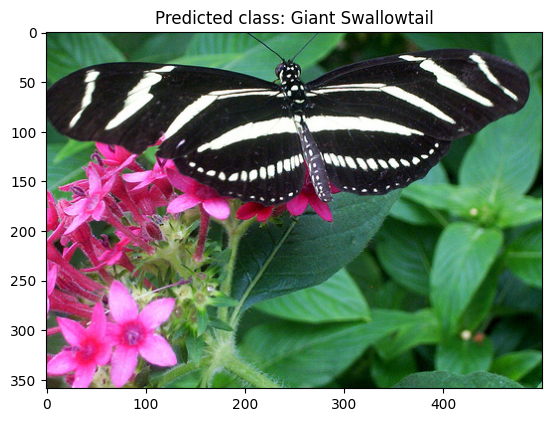

1/1 [==============================] - 0s 482ms/step
[[3.1482652e-28 1.0000000e+00 5.1842756e-37 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.7498745e-14 0.0000000e+00 0.0000000e+00 0.0000000e+00]]


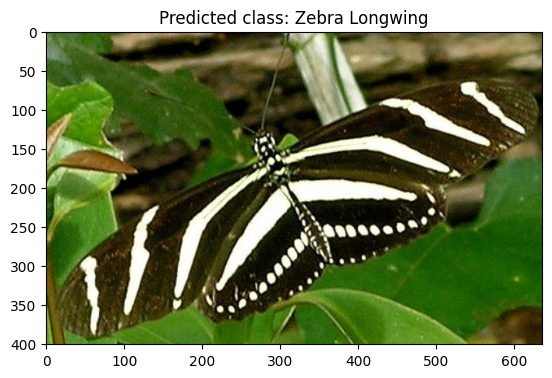

1/1 [==============================] - 0s 459ms/step
[[4.3049336e-12 9.9998617e-01 1.3792130e-05 2.3495004e-32 7.1238307e-29
  3.3109038e-30 1.1310029e-24 0.0000000e+00 1.8770608e-18 7.0366277e-27]]


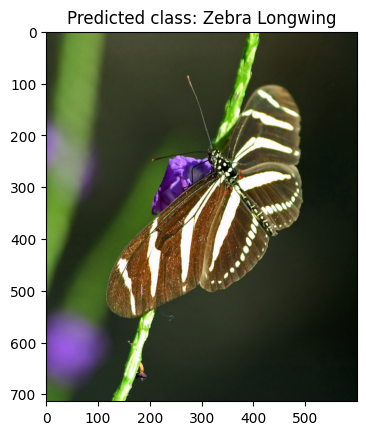

1/1 [==============================] - 0s 479ms/step
[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]


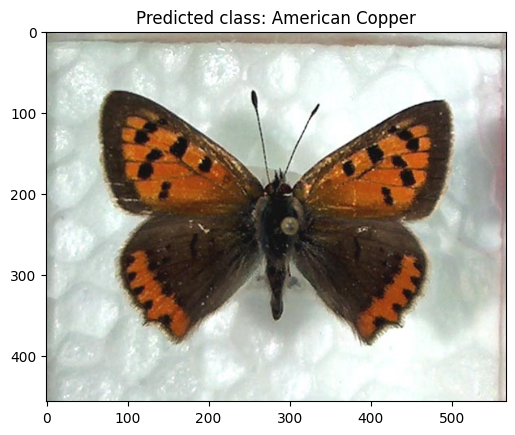

1/1 [==============================] - 0s 469ms/step
[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]


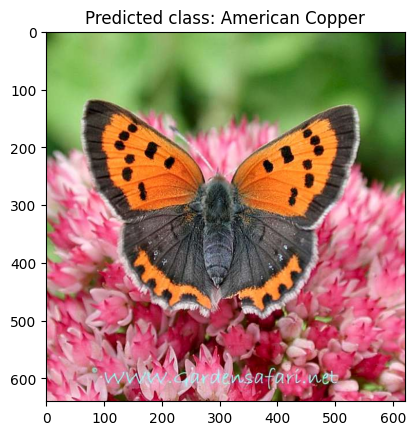

1/1 [==============================] - 1s 834ms/step
[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]


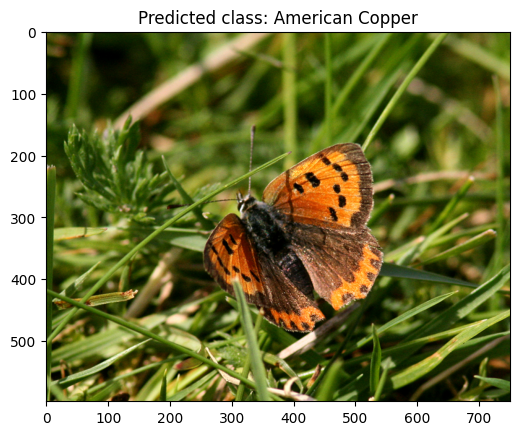

1/1 [==============================] - 1s 1s/step
[[0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 1.647875e-27
  0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 1.000000e+00]]


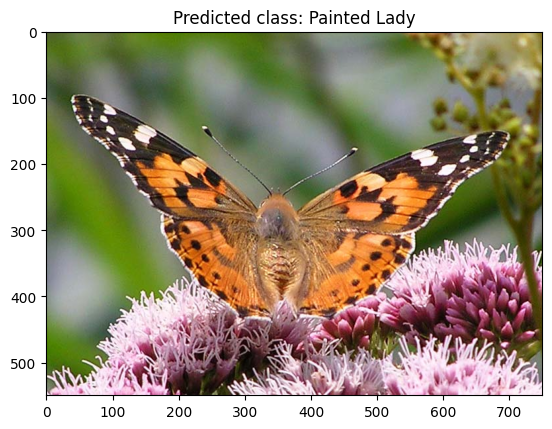

1/1 [==============================] - 1s 848ms/step
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 2.9569455e-36 9.6964593e-19
  0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00]]


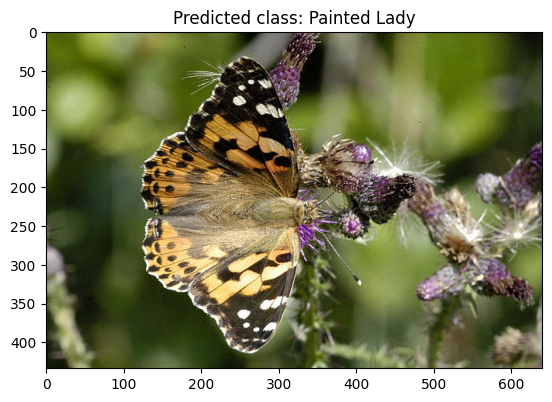

1/1 [==============================] - 1s 1s/step
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 1.5413908e-24 3.1853704e-24
  0.0000000e+00 4.9396129e-36 0.0000000e+00 3.7380682e-38 1.0000000e+00]]


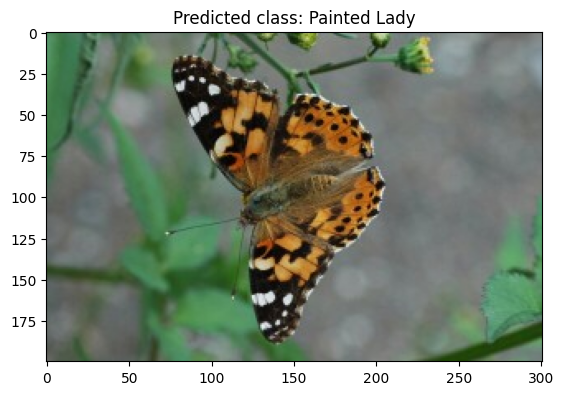

1/1 [==============================] - 0s 470ms/step
[[1.0000000e+00 0.0000000e+00 0.0000000e+00 9.8497853e-36 6.5746788e-35
  0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 3.3541562e-17]]


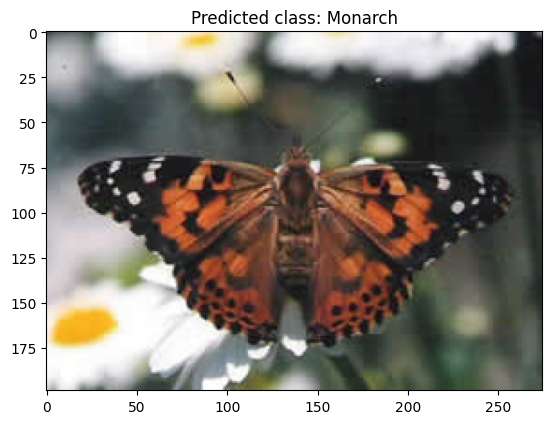

1/1 [==============================] - 0s 472ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]


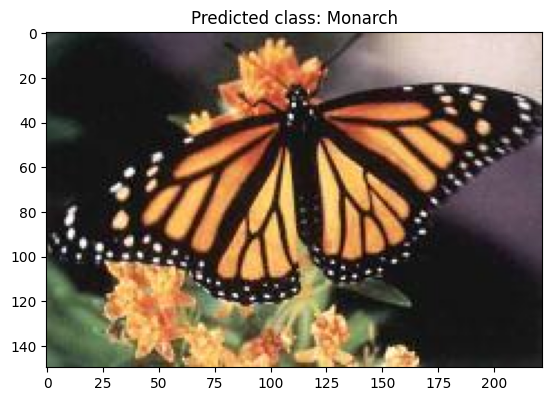

1/1 [==============================] - 0s 476ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]


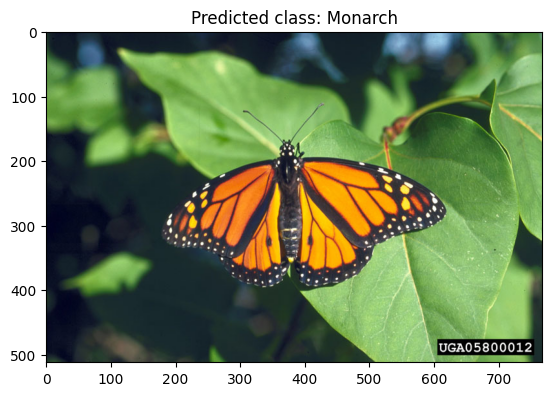

1/1 [==============================] - 0s 494ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]


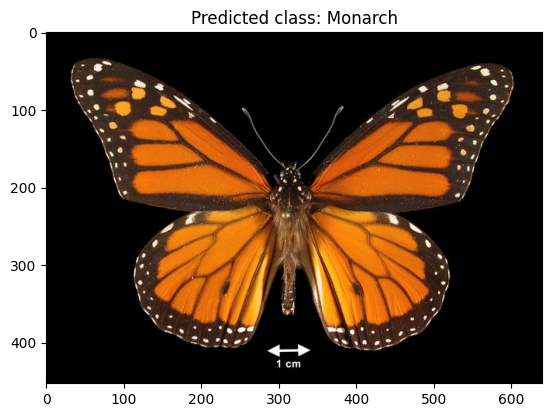

1/1 [==============================] - 0s 467ms/step
[[1.5544221e-04 1.4249571e-31 0.0000000e+00 5.3512336e-30 5.4417632e-17
  9.9984455e-01 2.9753061e-10 1.1918828e-15 1.0523225e-30 1.2522415e-14]]


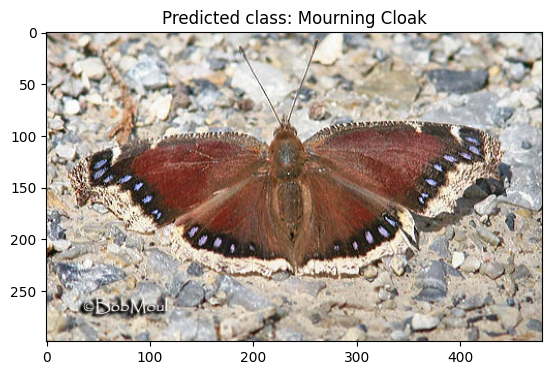

1/1 [==============================] - 0s 453ms/step
[[2.6420921e-26 0.0000000e+00 0.0000000e+00 1.2066538e-37 2.0136885e-19
  5.3404295e-04 9.9946600e-01 2.9918198e-31 1.8780342e-16 1.4823202e-14]]


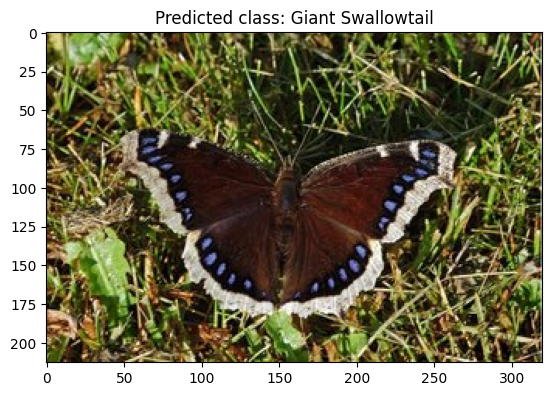

1/1 [==============================] - 1s 820ms/step
[[1.8663900e-34 0.0000000e+00 0.0000000e+00 5.2145093e-27 2.6565928e-20
  1.0000000e+00 4.2731952e-23 0.0000000e+00 2.1583940e-28 4.1991766e-12]]


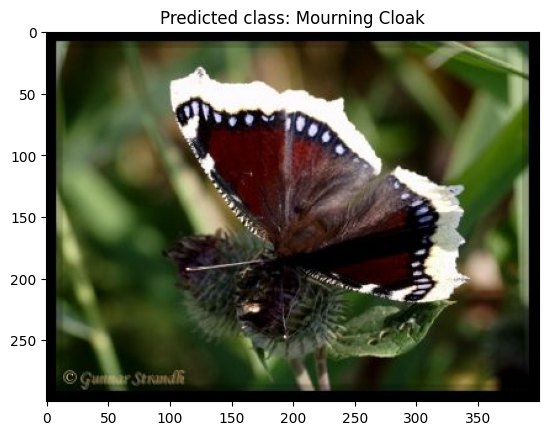

1/1 [==============================] - 1s 847ms/step
[[3.4805048e-37 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]]


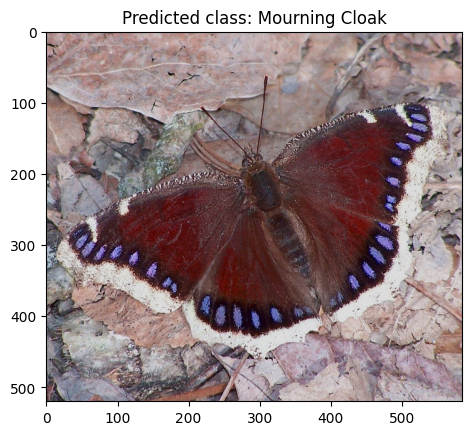

1/1 [==============================] - 1s 799ms/step
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 9.9999976e-01
  0.0000000e+00 0.0000000e+00 2.1647409e-07 0.0000000e+00 0.0000000e+00]]


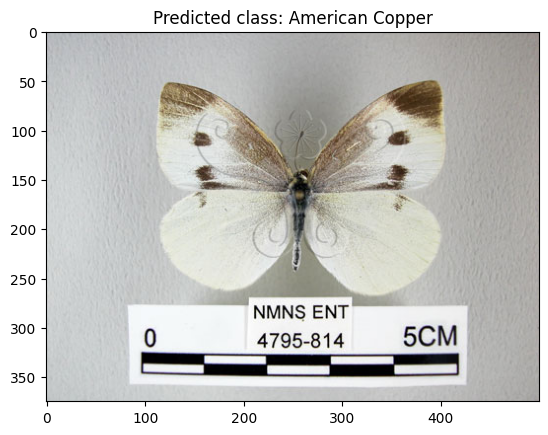

1/1 [==============================] - 0s 483ms/step
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]


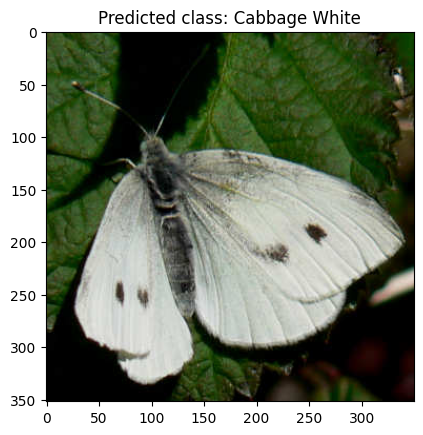

In [ ]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Model
model = tf.keras.models.load_model('/content/drive/MyDrive/Computer Engineering/dataScienceProject/newModel/butterfly-Image_model_weights.hdf5')

# Modelin uygulanması ve tahminlerin alınması
def apply_model(image_path):
    img = Image.open(image_path)
    img = img.resize((model.input_shape[1], model.input_shape[2]))
    img_array = np.expand_dims(np.array(img), axis=0)
    predictions = model.predict(img_array)
    return predictions

# Görüntü dizininin bulunduğu path
image_dir = '/content/drive/MyDrive/Computer Engineering/dataScienceProject/leedsbutterfly/images/test2/'

# Dizindeki tüm dosyaları al
image_files = [f for f in os.listdir(image_dir)]

print(image_files)

# Her bir görüntü için tahminlerin alınması ve sınıf adının yazdırılması
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    predictions = apply_model(image_path)
    print(predictions)

    # Tahminlerden maksimum olan indeksi bulun
    predicted_class_index = np.argmax(predictions)

    # Maksimum indeksi kullanarak sınıf adını alın
    predicted_class_name = class_names[predicted_class_index]

    # Orijinal görüntüyü ekrana yazdırın
    img = Image.open(image_path)
    plt.imshow(img)
    plt.title(f"Predicted class: {predicted_class_name}")
    plt.show()


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from plotly.subplots import make_subplots



img, label = test.next()

rows,cols = 4,4
fig = make_subplots(rows=rows, cols=cols,horizontal_spacing=0.05,subplot_titles=[class_names[np.argmax(label[i])] for i in range(rows*cols)])
indx=0
for i in range(rows):
    for j in range(cols):
        fig.add_trace(px.imshow(img[indx]).data[0],i+1,j+1)
        indx+=1
        fig.update_layout(width=1000,height=1000)
        fig.update_xaxes(showticklabels=False)
        fig.update_yaxes(showticklabels=False)
fig.show()